In [1]:
import os
import torch
from torch import nn
import numpy as np
import cv2

import matplotlib.pyplot as plt

In [2]:
!wget https://raw.githubusercontent.com/pjreddie/darknet/master/cfg/yolov3.cfg

--2021-06-01 02:50:00--  https://raw.githubusercontent.com/pjreddie/darknet/master/cfg/yolov3.cfg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.110.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8342 (8.1K) [text/plain]
Saving to: ‘yolov3.cfg’

yolov3.cfg          100%[===================>]   8.15K  --.-KB/s    in 0s      

2021-06-01 02:50:00 (45.7 MB/s) - ‘yolov3.cfg’ saved [8342/8342]



In [3]:
!wget https://pjreddie.com/media/files/yolov3.weights

--2021-06-01 02:50:02--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘yolov3.weights’

yolov3.weights      100%[===================>] 236.52M   326KB/s    in 4m 7s   

2021-06-01 02:54:10 (981 KB/s) - ‘yolov3.weights’ saved [248007048/248007048]



In [4]:
!wget https://raw.githubusercontent.com/ayooshkathuria/YOLO_v3_tutorial_from_scratch/master/data/coco.names

--2021-06-01 02:54:10--  https://raw.githubusercontent.com/ayooshkathuria/YOLO_v3_tutorial_from_scratch/master/data/coco.names
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.110.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 625 [text/plain]
Saving to: ‘coco.names’

coco.names          100%[===================>]     625  --.-KB/s    in 0s      

2021-06-01 02:54:10 (5.56 MB/s) - ‘coco.names’ saved [625/625]



In [5]:
!cat "yolov3.cfg"

[net]
# Testing
# batch=1
# subdivisions=1
# Training
batch=64
subdivisions=16
width=608
height=608
channels=3
momentum=0.9
decay=0.0005
angle=0
saturation = 1.5
exposure = 1.5
hue=.1

learning_rate=0.001
burn_in=1000
max_batches = 500200
policy=steps
steps=400000,450000
scales=.1,.1

[convolutional]
batch_normalize=1
filters=32
size=3
stride=1
pad=1
activation=leaky

# Downsample

[convolutional]
batch_normalize=1
filters=64
size=3
stride=2
pad=1
activation=leaky

[convolutional]
batch_normalize=1
filters=32
size=1
stride=1
pad=1
activation=leaky

[convolutional]
batch_normalize=1
filters=64
size=3
stride=1
pad=1
activation=leaky

[shortcut]
from=-3
activation=linear

# Downsample

[convolutional]
batch_normalize=1
filters=128
size=3
stride=2
pad=1
activation=leaky

[convolutional]
batch_normalize=1
filters=64
size=1
stride=1
pad=1
activation=leaky

[convolutional]
batch_normalize=1
filters=128
size=3
stride=1
pad=1
activation=leaky

[shortcut]
from=-3
activation=linear

[convolutiona

In [6]:
class EmptyLayer(nn.Module):
    def __init__(self):
        super(EmptyLayer, self).__init__()

In [7]:
class DetectionLayer(nn.Module):
    def __init__(self, anchors):
        super(DetectionLayer, self).__init__()
        self.anchors = anchors

In [8]:
def parse_config(config_path):
    def line_preprocess(line):
        return line.strip()

    def line_filter(line):
        if len(line) == 0:
            return False
        if line[0] == '#':
            return False
        return True
        
    with open(config_path, 'r') as config_file:
        lines = list(config_file)
    lines = list(map(line_preprocess, lines))
    lines = list(filter(line_filter, lines))

    blocks = []
    block = None
    for line in lines:
        if line[0] == '[':
            if block is not None:
                blocks.append(block)
            block = {}
            block['type'] = line[1:-1].strip()
        else:
            key, value = line.split("=")
            block[key.rstrip()] = value.lstrip()
    if block is not None:
        blocks.append(block)
    return blocks

In [9]:
def create_modules(blocks):
    net_info = blocks[0]
    module_list = nn.ModuleList()
    prev_filters = 3
    output_filters = []
    for index, block in enumerate(blocks[1:]):
        module = nn.Sequential()
        if block['type'] == 'convolutional':
            activation = block['activation']
            filters= int(block["filters"])
            padding = int(block["pad"])
            kernel_size = int(block["size"])
            stride = int(block["stride"])
            if 'batch_normalize' in block:
                batch_normalize = int(block['batch_normalize'])
            else:
                batch_normalize = 0
            bias = batch_normalize == 0
            if padding:
                pad = (kernel_size - 1) // 2
            else:
                pad = 0
            conv = nn.Conv2d(
                prev_filters, filters, kernel_size,
                stride, pad, bias=bias
            )
            module.add_module(f'conv_{index}', conv)
            if batch_normalize:
                bn = nn.BatchNorm2d(filters)
                module.add_module(f'batch_norm_{index}', bn)
            if activation == 'leaky':
                act = nn.LeakyReLU(0.1, inplace=True)
                module.add_module(f'leaky_{index}', act)
        if block['type'] == 'upsample':
            stride = int(block['stride'])
            upsample = nn.Upsample(scale_factor=stride, mode='bilinear', align_corners=True)
            module.add_module(f'upsample_{index}', upsample)
        if block['type'] == 'route':
            values = block['layers'].split(',')
            start = int(values[0])
            if len(values) == 2:
                end = int(values[1])
            else:
                end = 0
            if start > 0:
                start = start - index
            if end > 0:
                end = end - index
            route = EmptyLayer()
            module.add_module(f'route_{index}', route)
            if end < 0:
                filters = output_filters[index + start] + output_filters[index + end]
            else:
                filters= output_filters[index + start]
        if block['type'] == 'shortcut':
            shortcut = EmptyLayer()
            module.add_module(f'shortcut_{index}', shortcut)
        if block['type'] == 'yolo':
            mask = list(map(int, block['mask'].split(',')))
            anchors = list(map(int, block['anchors'].split(',')))
            anchors = [(anchors[i], anchors[i+1]) for i in range(0, len(anchors), 2)]
            anchors = [anchors[i] for i in mask]
            detection = DetectionLayer(anchors)
            module.add_module(f'Detection_{index}', detection)
        module_list.append(module)
        prev_filters = filters
        output_filters.append(filters)
    return (net_info, module_list)

In [10]:
def predict_transform(prediction, input_dim, anchors, num_classes, CUDA=True):
    batch_size = prediction.size(0)
    stride = input_dim // prediction.size(2)
    grid_size = input_dim // stride
    bbox_attrs = 5 + num_classes
    num_anchors = len(anchors)

    prediction = prediction.view(batch_size, bbox_attrs * num_anchors, grid_size * grid_size)
    prediction = prediction.transpose(1, 2).contiguous()
    prediction = prediction.view(batch_size, grid_size * grid_size * num_anchors, bbox_attrs)
    anchors = [(a[0] / stride, a[1] / stride) for a in anchors]
    prediction[:, :, 0] = torch.sigmoid(prediction[:, :, 0])
    prediction[:, :, 1] = torch.sigmoid(prediction[:, :, 1])
    prediction[:, :, 4] = torch.sigmoid(prediction[:, :, 4])
    prediction[:, :, 5: 5 + num_classes] = torch.sigmoid((prediction[:,:, 5 : 5 + num_classes]))

    grid = np.arange(grid_size)
    a,b = np.meshgrid(grid, grid)
    x_offset = torch.FloatTensor(a).view(-1,1)
    y_offset = torch.FloatTensor(b).view(-1,1)
    if CUDA:
        x_offset = x_offset.cuda()
        y_offset = y_offset.cuda()
    x_y_offset = torch.cat((x_offset, y_offset), 1).repeat(1,num_anchors).view(-1,2).unsqueeze(0)
    prediction[:, :, :2] += x_y_offset

    anchors = torch.FloatTensor(anchors)
    if CUDA:
        anchors = anchors.cuda()
    anchors = anchors.repeat(grid_size * grid_size, 1).unsqueeze(0)
    prediction[:, :, 2:4] = torch.exp(prediction[:,:,2:4]) * anchors
    prediction[:,:,:4] *= stride
    return prediction

In [11]:
def bbox_area(bbox):
    batch_size = bbox.size()[:-1]
    bbox = bbox.reshape(-1, 4)
    w = torch.clamp((bbox[:, 2] - bbox[:, 0]), min=0)
    h = torch.clamp((bbox[:, 3] - bbox[:, 1]), min=0)
    result = w * h
    return result.reshape(*batch_size, -1)


def bbox_iou(bbox_1, bbox_2):
    size_1 = bbox_1.size(0)
    size_2 = bbox_2.size(0)
    bbox_1 = bbox_1.repeat(size_2, 1, 1).transpose(0, 1)
    bbox_2 = bbox_2.repeat(size_1, 1, 1)
    areas_1 = bbox_area(bbox_1)
    areas_2 = bbox_area(bbox_2)
    inter_x1 = torch.maximum(bbox_1[:, :, 0], bbox_2[:, :, 0]).unsqueeze(-1)
    inter_y1 = torch.maximum(bbox_1[:, :, 1], bbox_2[:, :, 1]).unsqueeze(-1)
    inter_x2 = torch.minimum(bbox_1[:, :, 2], bbox_2[:, :, 2]).unsqueeze(-1)
    inter_y2 = torch.minimum(bbox_1[:, :, 3], bbox_2[:, :, 3]).unsqueeze(-1)
    bbox_inter = torch.cat((inter_x1, inter_y1, inter_x2, inter_y2), -1)
    areas_inter = torch.clamp(bbox_area(bbox_inter), min=0)
    result = areas_inter / (areas_1 + areas_2 - areas_inter)
    result = result.squeeze(-1)
    return result

In [12]:
bbox_1 = torch.tensor([[0, 0, 2, 2], [2, 1, 4, 3]], dtype=torch.float32)
bbox_2 = torch.tensor([[1, 1, 3, 3], [5, 5, 6, 6]], dtype=torch.float32)
iou = bbox_iou(bbox_1, bbox_2)
print(iou)

tensor([[0.1429, 0.0000],
        [0.3333, 0.0000]])


In [13]:
def write_results(prediction, confidence, num_classes, nms_conf = 0.4):
    box_corner = torch.zeros_like(prediction[:, :, :4])
    box_corner[:, :, 0] = (prediction[:, :, 0] - prediction[:, :, 2]/2)
    box_corner[:, :, 1] = (prediction[:, :, 1] - prediction[:, :, 3]/2)
    box_corner[:, :, 2] = (prediction[:, :, 0] + prediction[:, :, 2]/2)
    box_corner[:, :, 3] = (prediction[:, :, 1] + prediction[:, :, 3]/2)
    prediction[:, :, :4] = box_corner
    batch_size = prediction.size(0)
    output = []
    for ind in range(batch_size):
        image_pred = prediction[ind]
        max_conf, max_conf_score = torch.max(image_pred[:,5:5+ num_classes], 1)
        max_conf = max_conf.float().unsqueeze(1)
        max_conf_score = max_conf_score.float().unsqueeze(1)
        seq = (image_pred[:,:5], max_conf, max_conf_score)
        image_pred = torch.cat(seq, 1)
        if (image_pred[:, 4] <= confidence).all().item():
            continue
        image_pred_ = image_pred[image_pred[:, 4] > confidence]
        image_classes = torch.unique(image_pred_[:, -1])
        for cls in image_classes:
            image_pred_class = image_pred_[image_pred_[:,-1] == cls]
            conf_sort_index = torch.sort(image_pred_class[:, 4], descending =True)[1]
            image_pred_class = image_pred_class[conf_sort_index]
            bboxes = image_pred_class.size(0)
            while image_pred_class.size(0) > 0:
                output.append(image_pred_class[0].unsqueeze(0))
                if image_pred_class.size(0) == 1:
                    break
                ious = bbox_iou(image_pred_class[0, :4].unsqueeze(0), image_pred_class[1:, :4]).squeeze(0)
                image_pred_class = image_pred_class[1:]
                image_pred_class = image_pred_class[ious < nms_conf]
    if len(output) != 0:
        output = torch.cat(output, 0)
    else:
        output = None
    return output

In [14]:
def read_img(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

In [15]:
def aspect_transform(w, h, w_new, h_new):
    alpha = min(h_new / h, w_new / w)
    x_offset = (w_new - alpha * w) / 2
    y_offset = (h_new - alpha * h) / 2
    return alpha, x_offset, y_offset

In [16]:
def inv_aspect_transform_results(bboxes, asp):
    alpha, xo, yo = asp
    bboxes = bboxes.detach().clone()
    bboxes[:, [0, 2]] = (bboxes[:, [0, 2]] - xo) / alpha
    bboxes[:, [1, 3]] = (bboxes[:, [1, 3]] - yo) / alpha
    return bboxes

In [17]:
def resize_aspect(img, w, h):
    img_w = img.shape[1]
    img_h = img.shape[0]
    alpha, xo, yo = aspect_transform(img_w, img_h, w, h)
    new_w = int(img_w * alpha)
    new_h = int(img_h * alpha)
    new_img = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_CUBIC)
    canvas = np.full((h, w, 3), 128)
    c1 = (int(xo), int(yo))
    c2 = (c1[0] + new_w, c1[1] + new_h)
    canvas[c1[1]: c2[1], c1[0]: c2[0], :] = new_img
    return canvas.astype(np.uint8)

In [18]:
def uniform_color_palette(num_classes):
    hues = np.linspace(0, 160, num=num_classes).astype(np.uint8)
    palette = np.full((num_classes, 3), 255, dtype=np.uint8)
    palette[:, 0] = hues
    palette = palette[np.newaxis]
    palette = cv2.cvtColor(palette, cv2.COLOR_HSV2RGB)
    return palette

def draw_palette(palette, height=40, width=10):
    img = palette.repeat(width, axis=1)
    img = np.tile(img, (height, 1, 1))
    return img

In [19]:
p = uniform_color_palette(80)
p_img = draw_palette(p)
plt.imshow(p_img)
plt.axis('off')
plt.show()

In [20]:
def draw_bbox(img, bbox, label, color):
    c1 = tuple(bbox[0:2].int().numpy())
    c2 = tuple(bbox[2:4].int().numpy())
    img = cv2.rectangle(img, c1, c2, color, 1)
    t_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_PLAIN, 1, 1)[0]
    c1 = c1[0], c1[1] - t_size[1] 
    c2 = c1[0] + t_size[0], c1[1] + t_size[1]
    img = cv2.rectangle(img, c1, c2, color, -1)
    img = cv2.putText(img, label, (c1[0], c1[1] + t_size[1]), cv2.FONT_HERSHEY_PLAIN, 1, [0,0,0], 1)
    return img

def draw_predictions(img, bboxes, palette, classes):
    img_bbox = img.copy()
    for bbox in bboxes:
        cls = int(bbox[-1])
        color = list(map(int, palette[0, cls])) # wtf?? doesn't work with np types
        label = classes[cls]
        img_bbox = draw_bbox(img_bbox, bbox.cpu(), label, color)
    return img_bbox

In [21]:
def img_to_tensor(img):
    img = torch.from_numpy(img).float().permute(2,0,1).unsqueeze(0) / 255
    return img

In [22]:
def load_classes(names_path):
    with open(names_path, 'r') as names_file:
        names = [line.strip() for line in names_file]
    return names

In [23]:
# blocks = parse_config('yolov3.cfg')

In [24]:
# modules = create_modules(blocks)

In [25]:
# modules
# list(filter(lambda x: x['type'][0] == 'y', blocks))

In [26]:
class Darknet(nn.Module):
    def __init__(self, cfg_path):
        super(Darknet, self).__init__()
        self.blocks = parse_config(cfg_path)
        self.net_info, self.module_list = create_modules(self.blocks)
    def forward(self, x, CUDA):
        modules = self.blocks[1:]
        outputs = {}
        detections = None
        for i, module in enumerate(modules):
            module_type = modules[i]['type']
            if module_type == 'convolutional' or module_type == 'upsample':
                x = self.module_list[i](x)
            elif module_type == 'route':
                layers = module['layers'].split(',')
                layers = list(map(int, layers))
                if layers[0] > 0:
                    layers[0] = layers[0] - i
                if len(layers) == 1:
                    x = outputs[i + layers[0]]
                else:
                    if layers[1] > 0:
                        layers[1] = layers[1] - i
                    m1 = outputs[i + layers[0]]
                    m2 = outputs[i + layers[1]]
                    x = torch.cat((m1, m2), 1)
            elif module_type == 'shortcut':
                from_ = int(module["from"])
                x = outputs[i-1] + outputs[i+from_]
            elif module_type == 'yolo':
                anchors = self.module_list[i][0].anchors
                input_dim = int(self.net_info["height"])
                num_classes = int(module["classes"])
                x = x.detach()
                x = predict_transform(x, input_dim, anchors, num_classes, CUDA)
                if detections is None:
                    detections = x
                else:
                    detections = torch.cat((detections, x), 1)
            outputs[i] = x
        return detections


    def load_weights(self, weights_path):
        with open(weights_path, 'rb') as weights_file:
            header = np.fromfile(weights_file, dtype = np.int32, count = 5)
            self.header = torch.from_numpy(header)
            self.seen = self.header[3]
            weights = np.fromfile(weights_file, dtype = np.float32)
        ptr = 0
        with torch.no_grad():
            for i in range(len(self.module_list)):
                module_type = self.blocks[i + 1]['type']
                if module_type == 'convolutional':
                    model = self.module_list[i]
                    conv = model[0]
                    if 'batch_normalize' in self.blocks[i + 1]:
                        batch_normalize = int(self.blocks[i + 1]['batch_normalize'])
                    else:
                        batch_normalize = 0
                    if batch_normalize == 1:
                        bn = model[1]

                        #Get the number of weights of Batch Norm Layer
                        num_bn_biases = bn.bias.numel()

                        #Load the weights
                        bn_biases = torch.from_numpy(weights[ptr:ptr + num_bn_biases])
                        ptr += num_bn_biases

                        bn_weights = torch.from_numpy(weights[ptr: ptr + num_bn_biases])
                        ptr  += num_bn_biases

                        bn_running_mean = torch.from_numpy(weights[ptr: ptr + num_bn_biases])
                        ptr  += num_bn_biases

                        bn_running_var = torch.from_numpy(weights[ptr: ptr + num_bn_biases])
                        ptr  += num_bn_biases

                        #Cast the loaded weights into dims of model weights. 
                        bn_biases = bn_biases.view_as(bn.bias)
                        bn_weights = bn_weights.view_as(bn.weight)
                        bn_running_mean = bn_running_mean.view_as(bn.running_mean)
                        bn_running_var = bn_running_var.view_as(bn.running_var)

                        #Copy the data to model
                        bn.bias.copy_(bn_biases)
                        bn.weight.copy_(bn_weights)
                        bn.running_mean.copy_(bn_running_mean)
                        bn.running_var.copy_(bn_running_var)
                    else:
                        #Number of biases
                        num_biases = conv.bias.numel()

                        #Load the weights
                        conv_biases = torch.from_numpy(weights[ptr: ptr + num_biases])
                        ptr = ptr + num_biases

                        #reshape the loaded weights according to the dims of the model weights
                        conv_biases = conv_biases.view_as(conv.bias)

                        #Finally copy the data
                        conv.bias.copy_(conv_biases)
                    
                    num_weights = conv.weight.numel()

                    #Do the same as above for weights
                    conv_weights = torch.from_numpy(weights[ptr:ptr+num_weights])
                    ptr = ptr + num_weights

                    conv_weights = conv_weights.view_as(conv.weight)
                    conv.weight.copy_(conv_weights)

In [27]:
num_classes = 80
classes = load_classes('coco.names')

In [28]:
palette = uniform_color_palette(num_classes)
pos = np.arange(0, palette.shape[1], 1)
np.random.shuffle(pos)
palette = palette[:, pos]

In [29]:
CUDA = True

In [30]:
model = Darknet('yolov3.cfg')
model.load_weights('yolov3.weights')
if CUDA:
    model.cuda()
model.eval()

Darknet(
  (module_list): ModuleList(
    (0): Sequential(
      (conv_0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (batch_norm_0): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (leaky_0): LeakyReLU(negative_slope=0.1, inplace=True)
    )
    (1): Sequential(
      (conv_1): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (batch_norm_1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (leaky_1): LeakyReLU(negative_slope=0.1, inplace=True)
    )
    (2): Sequential(
      (conv_2): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (batch_norm_2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (leaky_2): LeakyReLU(negative_slope=0.1, inplace=True)
    )
    (3): Sequential(
      (conv_3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (batch

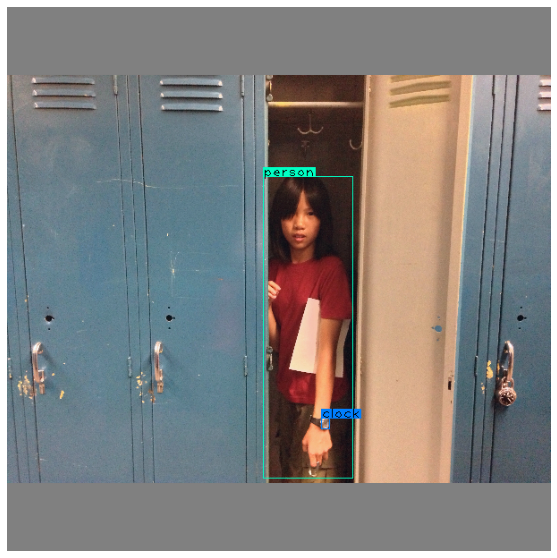

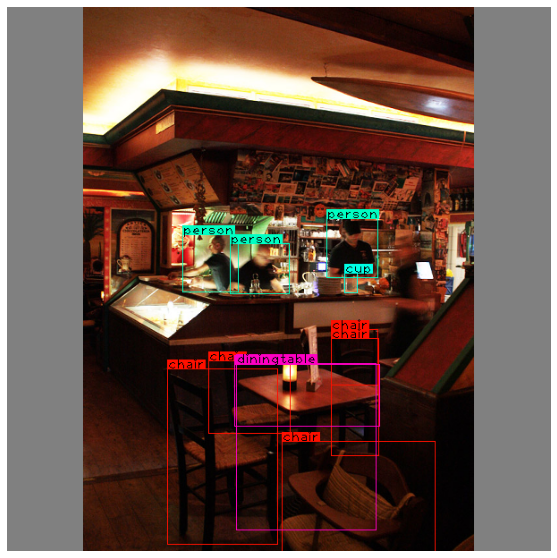

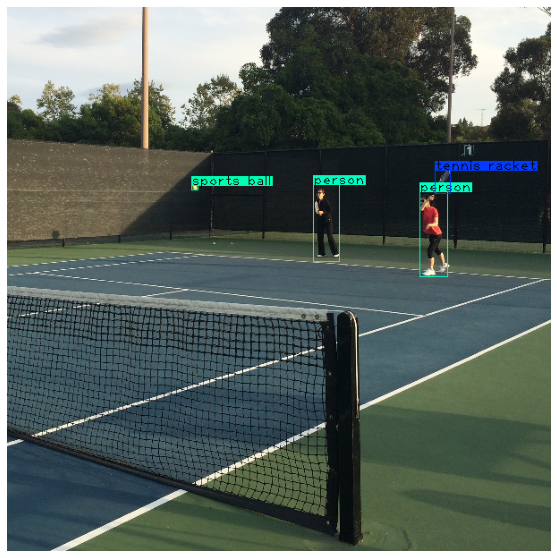

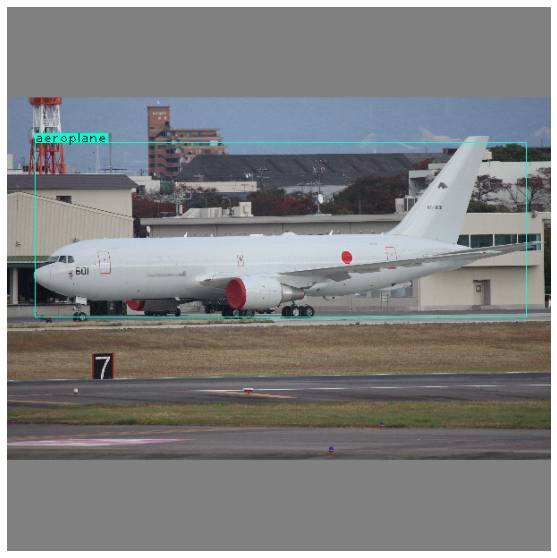

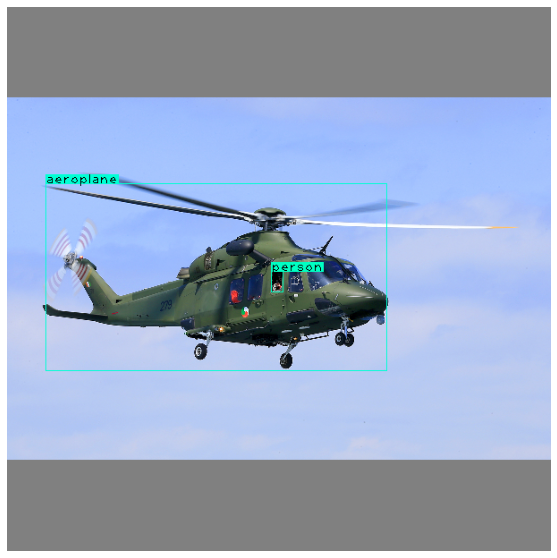

...

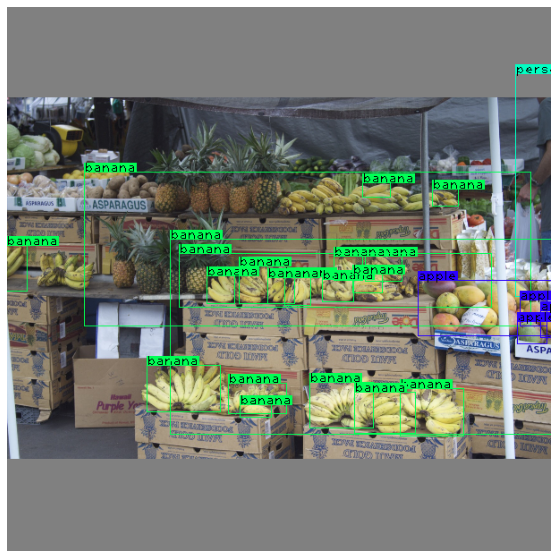

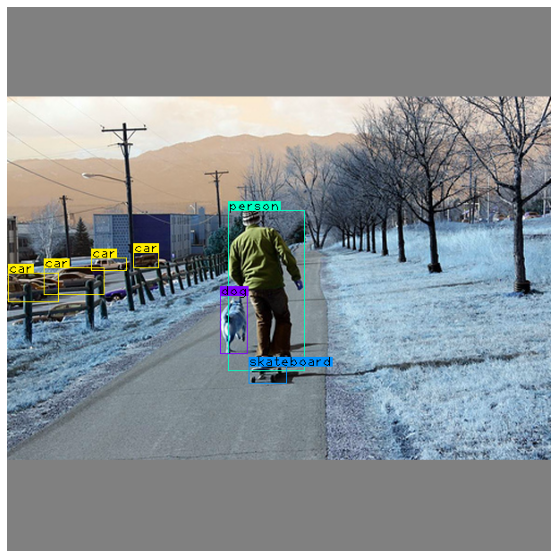

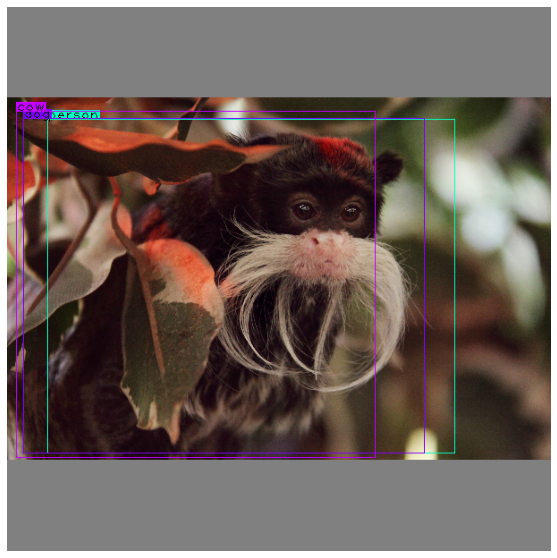

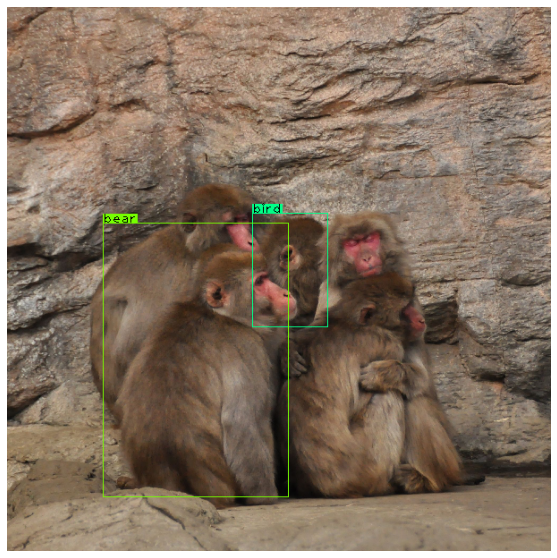

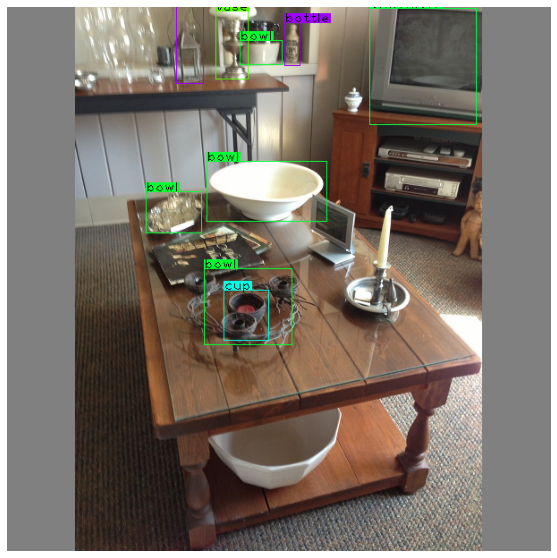

In [31]:
for img_name in os.listdir('test_images/'):
    img_path = os.path.join('test_images', img_name)
    img = read_img(img_path)
    # img = read_img('test_img.png')
    img_aspect = resize_aspect(img, 608, 608)
    inp = img_to_tensor(img_aspect)
    if CUDA:
        inp = inp.cuda()
    pred = model(inp, torch.cuda.is_available())
    output = write_results(pred, 0.2, 80)
    asp = aspect_transform(img.shape[1], img.shape[0], 608, 608)
    if output is not None:
        output_original = inv_aspect_transform_results(output, asp)
        img_bbox = draw_predictions(img_aspect, output, palette, classes)
    plt.figure(figsize=(10, 10))
    plt.imshow(img_bbox)
    plt.axis('off')
    plt.show()